# Article visualizations

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import hcp_utils as hcp
from helper_functions import *

import nilearn as ni
import seaborn as sns
from matplotlib.colors import ListedColormap

import hcp_utils as hcp
from PIL import Image
import nilearn as ni
import seaborn as sns

dpi = 400

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


Content:

1) Synthetic data:
    - 1.1) Data visualization
        - Synthetic data generation
    - 1.2) Experiments
        - Experiment overview (dataframe)
    - 1.3) Results
        - Multiple experiments outputs:
            -  Alpha-scale plot (detection threshold)
        - Single experiment outputs (example):
            - MAP partition matrix Z
            - Cluster-link probability matrices
    
2) HCP data:
    - 2.1) Data visualization
        - Glasser graphs: Integer-weighted graphs in Glasser atlas resolution
    - 2.2) Experiments
        - Experiment overview (dataframe)
    - 2.3) Results
        -  Multiple experiments outputs:
            - Log probability over model iterations with errorbars (convergence plot)
            - MAP log probability over initial number of clusters with errorbars
            - Mean pairwise NMI between Z's for different initializations over number of clusters (e.g. mean([NMI(Z1,Z2),NMI(Z1,Z3),NMI(Z2,Z3)]))
        - Single experiment outputs (example for best run):
            - MAP partition matrix Z
            - Glasser graphs sorted/permuted wrt. Z
            - Brain map wrt. Z - from different views
            - Cluster-link probability matrices for each graph
            - Circular graph plot: Mean cluster-link probability with-in groups (across either fmri and dmri graphs)



## 1) Synthetic data

### 1.1) Data visualization
#### Synthetic data generation


In [10]:
GENERATE_NEW_DATA = False
if GENERATE_NEW_DATA:
    S1 = 5 # 5 or 10 (maybe just visualize for S1=5, i.e. not showing class imbalance case)
    S2 = 5 # 5

    for K in [2, 5, 10]:
        for Nc_type in ['balanced', 'unbalanced']:
            for alpha in np.append(np.linspace(0,1,11)[:10],[0.98,1]): #array([0.  , 0.1 , 0.2 , 0.3 , 0.4 , 0.5 , 0.6 , 0.7 , 0.8 , 0.9 , 0.98, 1.])
                A, Zini, Zexp, eta_p1, eta_p2 = generate_syndata(K=K, S1=S1, S2=S2, Nc_type=Nc_type, alpha=alpha, seed=0, save_data=True, disp_data = False, 
                                                label_fontsize=label_fontsize, subtitle_fontsize=subtitle_fontsize, title_fontsize=title_fontsize)
                

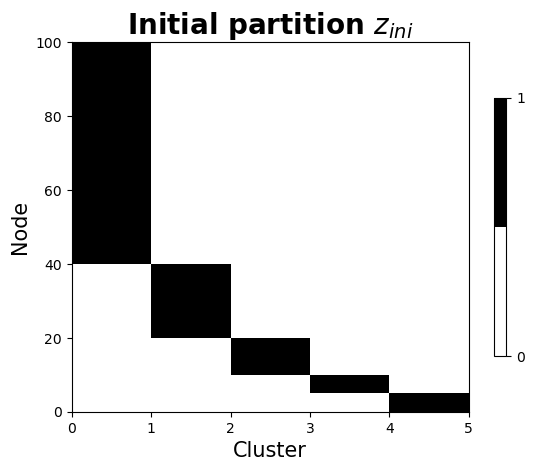

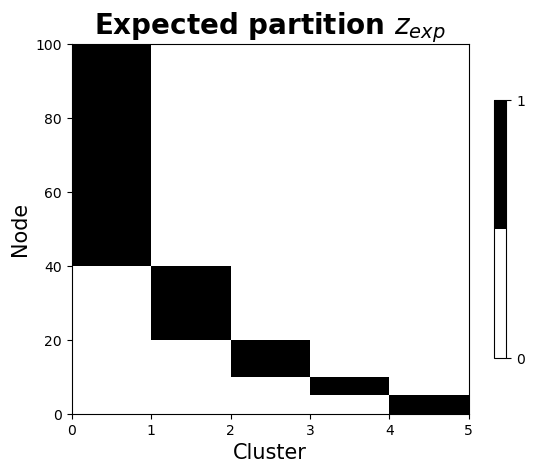

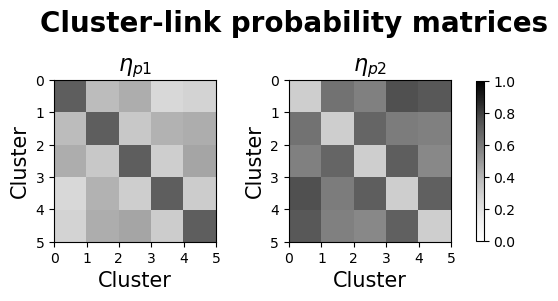

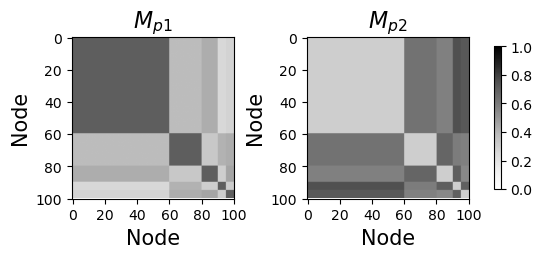

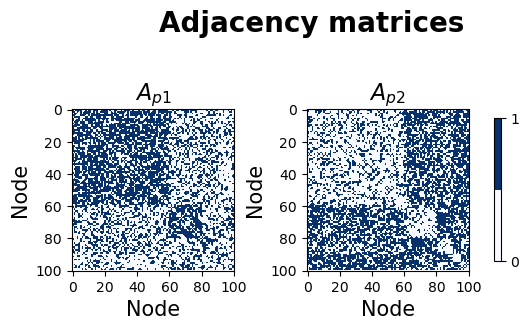

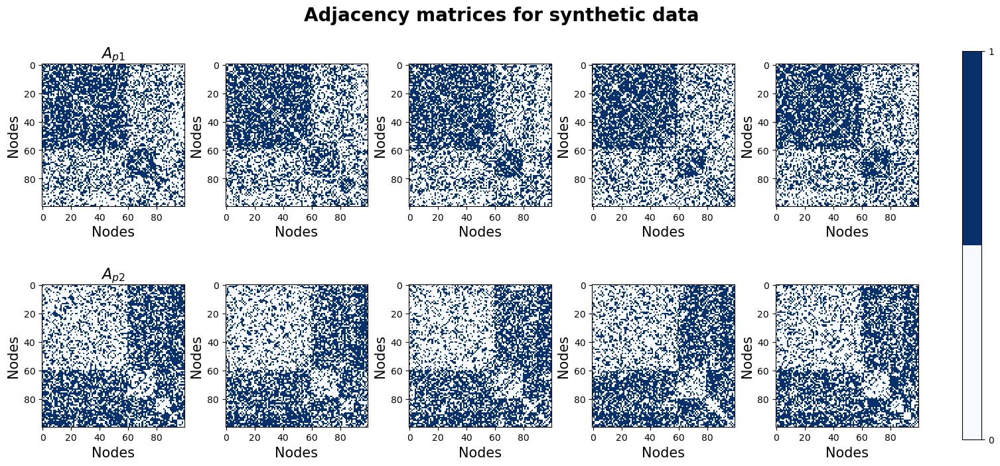

In [11]:
# Example visualization
K = 5
S1 = 5
S2 = 5
Nc_type = 'unbalanced'
alpha = 0.5
A, Zini, Zexp, eta_p1, eta_p2 = generate_syndata(K=K, S1=S1, S2=S2, Nc_type=Nc_type, alpha=alpha, seed=0, save_data=False, disp_data = True, 
                                        label_fontsize=label_fontsize, subtitle_fontsize=subtitle_fontsize, title_fontsize=title_fontsize)

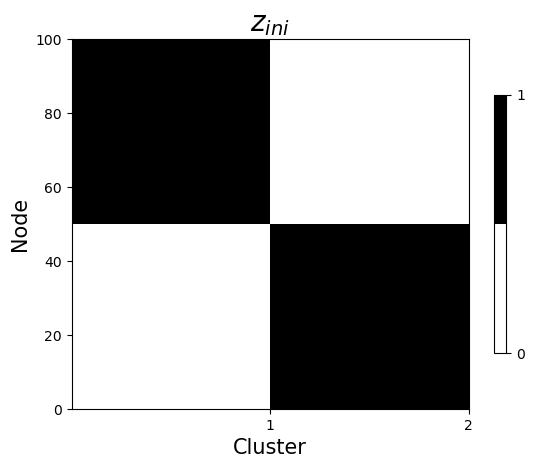

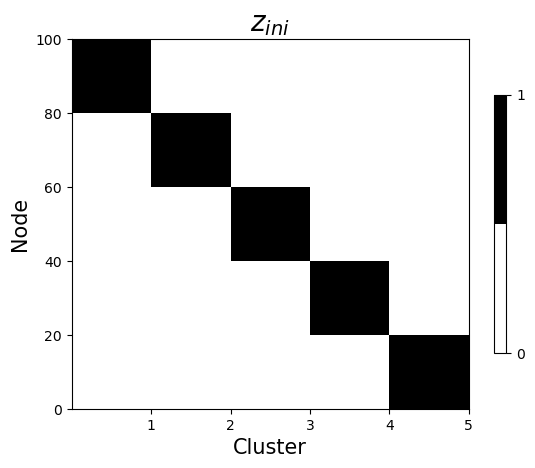

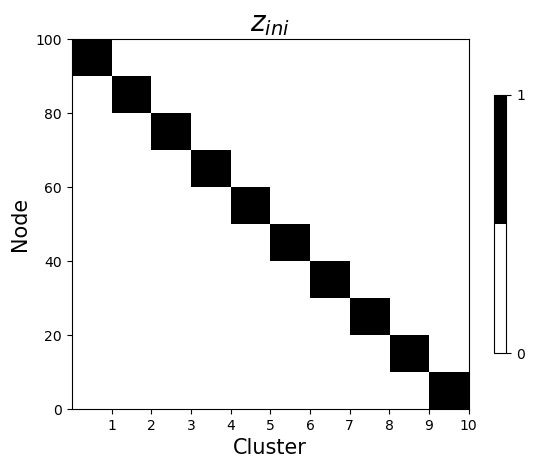

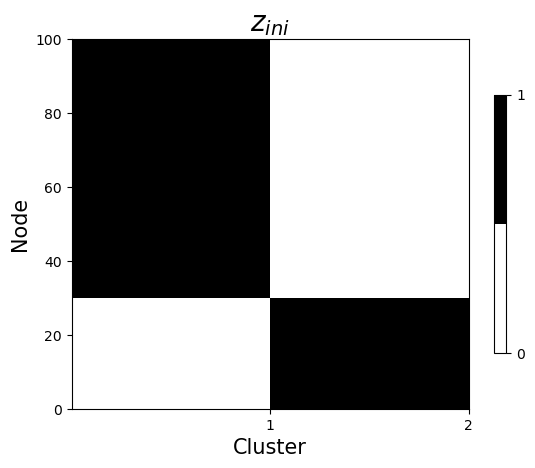

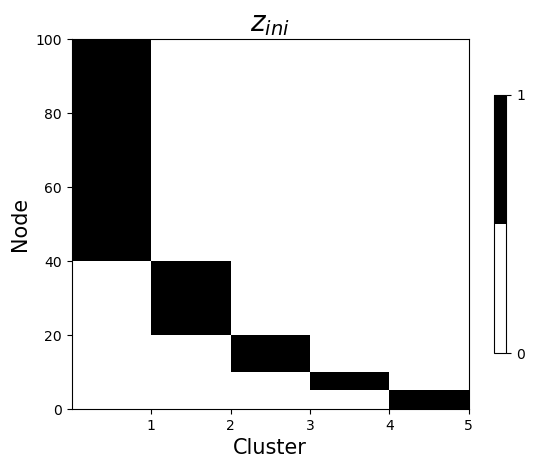

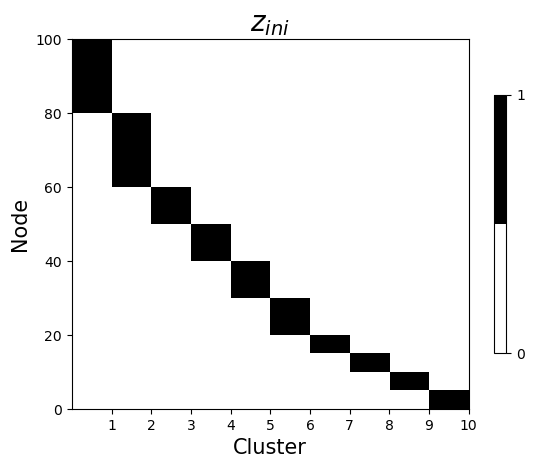

In [12]:
for Nc_type in ['balanced', 'unbalanced']:
    for K in [2,5,10]:
        Zini_filename = 'Zini_'+str(K)+'_'+str(Nc_type)
        Zini = np.load(os.path.join(main_dir,'data','synthetic',Zini_filename+'.npy'))

        x_ticks = range(1, Zini.shape[1]+1, 1)
        
        fig, ax = plt.subplots()
        if Zini.shape[1] == 1: #(only one cluster)
            cmap = ListedColormap(['k'])
        else:   
            cmap = ListedColormap(['w', 'k']) 
        im = ax.imshow(Zini, interpolation='nearest', aspect='auto', cmap=cmap, extent=(0, Zini.shape[1], 0, Zini.shape[0]))
        ax.set_ylabel('Node', fontsize=label_fontsize)
        ax.set_xlabel('Cluster', fontsize=label_fontsize)
        ax.set_xticks(x_ticks)
        ax.set_title('$z_{ini}$', fontsize=title_fontsize, weight='bold')
        #ax.set_title('Expected partition $Z_{exp}$', fontsize=title_fontsize, weight='bold')
        cbar = fig.colorbar(im, ax=ax, shrink=0.7, ticks=[0,1])
        plt.savefig(os.path.join(main_dir,'figures',Zini_filename+'.png'), bbox_inches='tight',dpi=dpi)

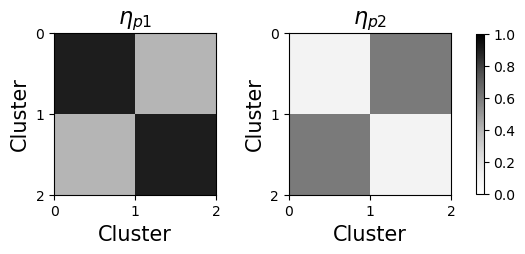

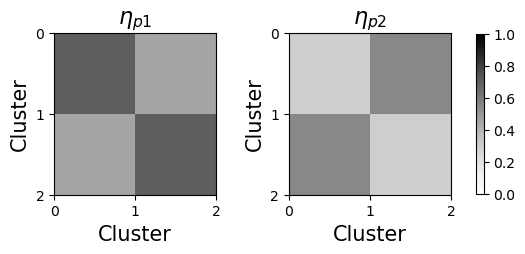

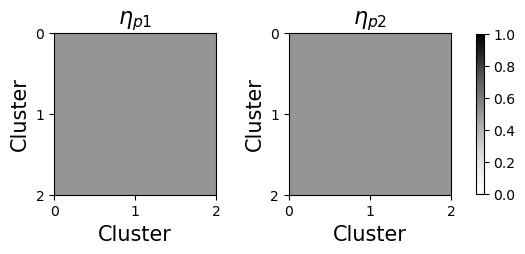

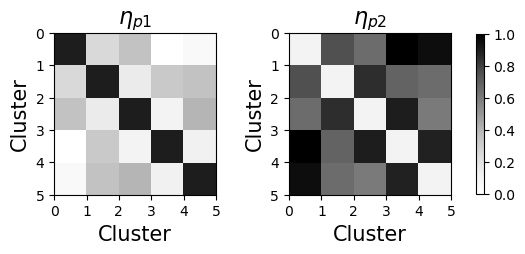

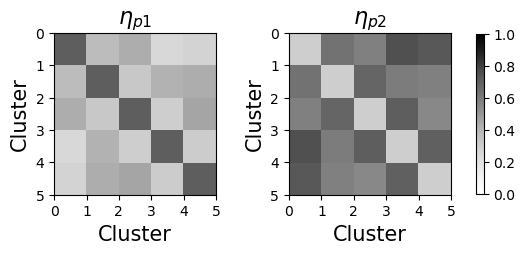

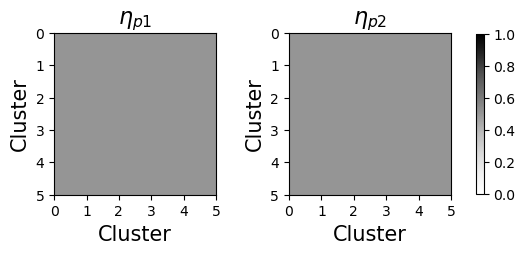

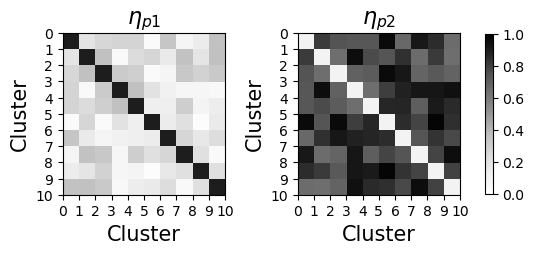

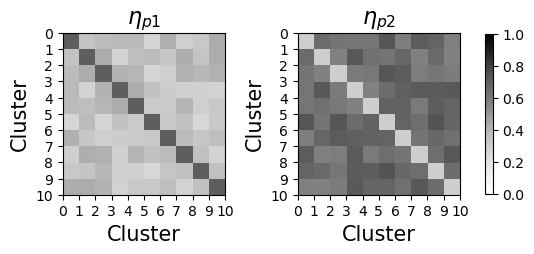

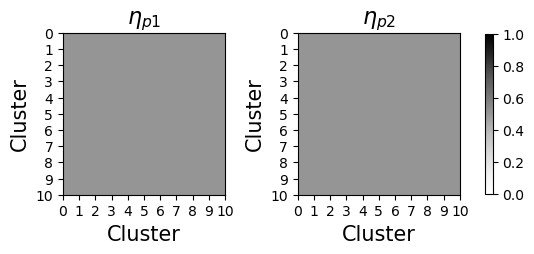

In [13]:
for K in [2,5,10]:
    for alpha in [0, 0.5, 1]:
        eta_filename = str(K)+'_{:.2g}'.format(alpha)

        eta_p1 = np.load(os.path.join(main_dir,'data','synthetic','eta_p1_'+eta_filename+'.npy'))
        eta_p2 = np.load(os.path.join(main_dir,'data','synthetic','eta_p2_'+eta_filename+'.npy'))
        
        K = eta_p1.shape[0]
        xy_ticks = range(0, K + 1, 1)
                
        cmap = plt.cm.Greys #plt.cm.Greens
        fig, ax = plt.subplots(1,2)
        plt.subplots_adjust(wspace=0.45, top=1.22)
        im = ax[0].imshow(eta_p1, cmap=cmap, extent=[0,K,K,0], vmin=0, vmax=1)
        ax[0].set_ylabel('Cluster', fontsize=label_fontsize)
        ax[0].set_xlabel('Cluster', fontsize=label_fontsize)
        ax[0].set_yticks(xy_ticks)
        ax[0].set_yticklabels(xy_ticks)
        ax[0].set_xticks(xy_ticks)
        ax[0].set_xticklabels(xy_ticks)
        ax[0].set_title('$\eta_{p1}$', fontsize=subtitle_fontsize, weight='bold')
        
        im = ax[1].imshow(eta_p2, cmap=cmap, extent=[0,K,K,0], vmin=0, vmax=1)
        ax[1].set_ylabel('Cluster', fontsize=label_fontsize)
        ax[1].set_xlabel('Cluster', fontsize=label_fontsize)
        ax[1].set_yticks(xy_ticks)
        ax[1].set_yticklabels(xy_ticks)
        ax[1].set_xticks(xy_ticks)
        ax[1].set_xticklabels(xy_ticks)
        ax[1].set_title('$\eta_{p2}$', fontsize=subtitle_fontsize, weight='bold')
        cbar = fig.colorbar(im, ax=ax.ravel().tolist(), shrink=0.3)
        #fig.suptitle('Cluster-link probability matrices',fontsize=title_fontsize, weight='bold')
        plt.savefig(os.path.join(main_dir,'figures','eta_'+eta_filename+'_types.png'), bbox_inches='tight',dpi=dpi)



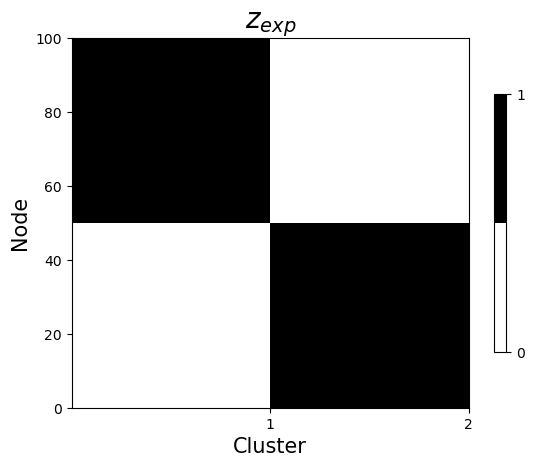

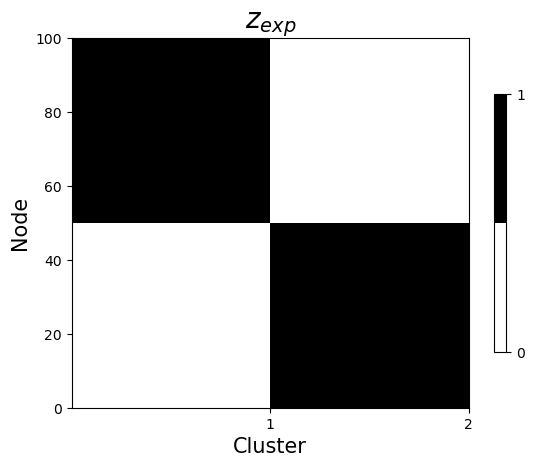

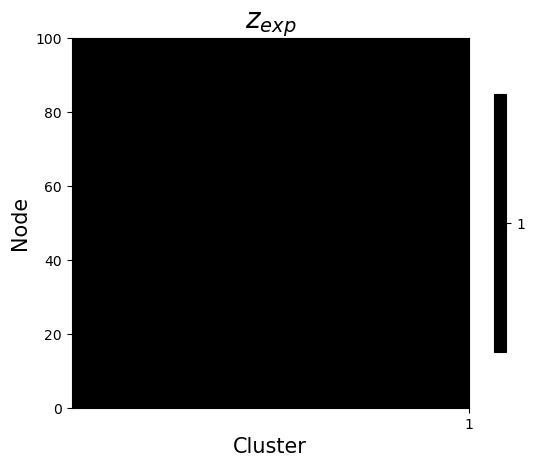

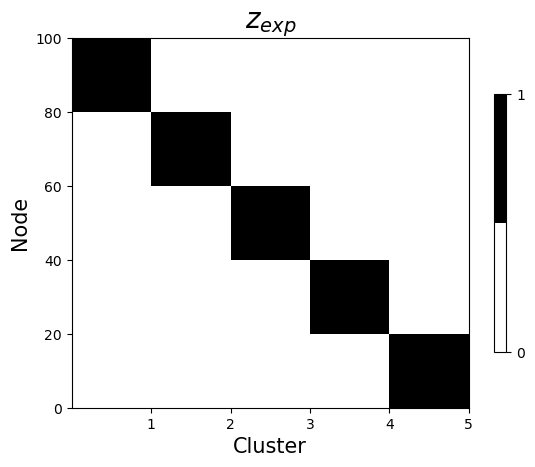

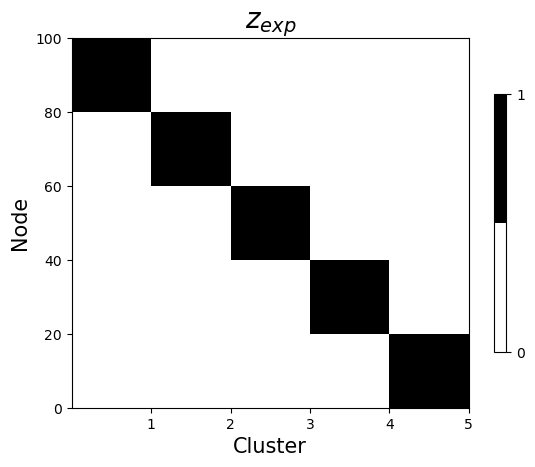

...

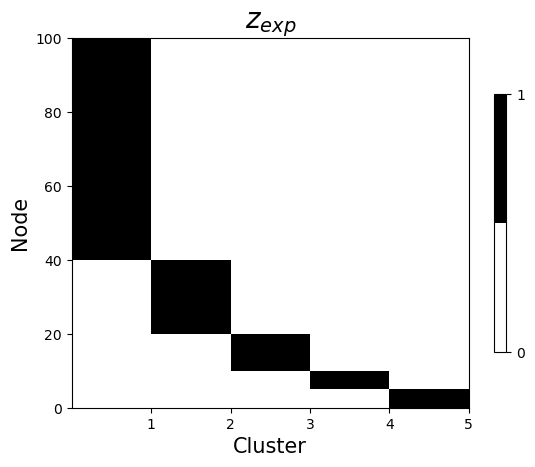

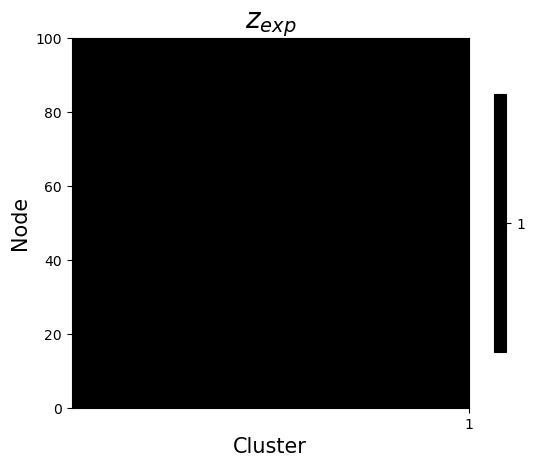

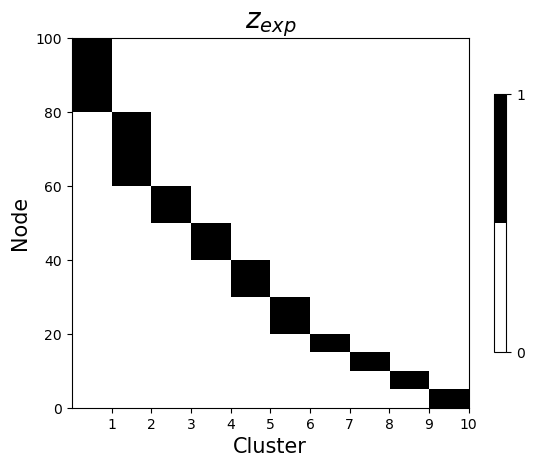

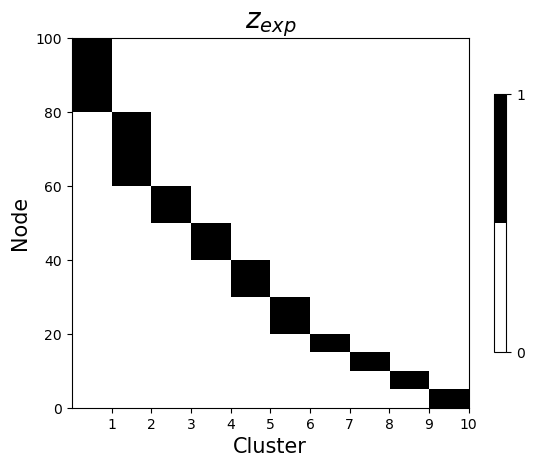

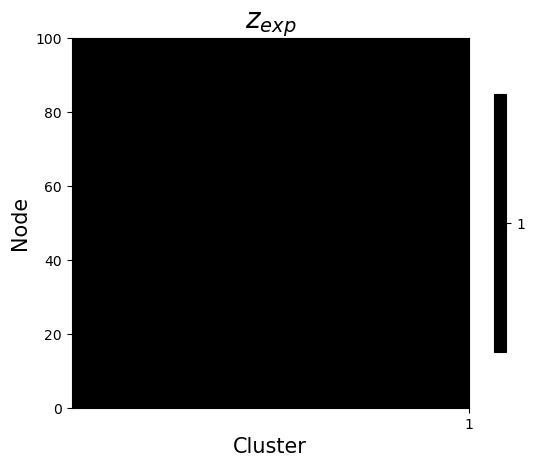

In [14]:
for Nc_type in ['balanced', 'unbalanced']:
    for K in [2,5,10]:
        for alpha in [0, 0.5, 1]:
            Zexp_filename = 'Zexp_'+str(K)+'_'+str(Nc_type)+'_{:.2g}'.format(alpha)
            Zexp = np.load(os.path.join(main_dir,'data','synthetic',Zexp_filename+'.npy'))

            x_ticks = range(1, Zexp.shape[1]+1, 1)
            
            fig, ax = plt.subplots()
            if Zexp.shape[1] == 1: #(only one cluster)
                cmap = ListedColormap(['k'])
            else:   
                cmap = ListedColormap(['w', 'k']) 
            im = ax.imshow(Zexp, interpolation='nearest', aspect='auto', cmap=cmap, extent=(0, Zexp.shape[1], 0, Zexp.shape[0]))
            ax.set_ylabel('Node', fontsize=label_fontsize)
            ax.set_xlabel('Cluster', fontsize=label_fontsize)
            ax.set_xticks(x_ticks)
            ax.set_title('$z_{exp}$', fontsize=title_fontsize, weight='bold')
            #ax.set_title('Expected partition $Z_{exp}$', fontsize=title_fontsize, weight='bold')
            cbar = fig.colorbar(im, ax=ax, shrink=0.7, ticks=[0,1])
            plt.savefig(os.path.join(main_dir,'figures',Zexp_filename+'.png'), bbox_inches='tight', dpi=dpi)

### 1.2) Experiments
#### Experiment overview (dataframe)


In [15]:
dataset = 'synthetic'
top_dir = os.path.join('results', dataset)
main_dir = os.getcwd()
df_exp = get_exp_overview(top_dir)

# sort dataframe
df_sorted = df_exp.sort_values(by=['noc','K','alpha','Nc_type']).reset_index(drop=True)

In [16]:
df_sorted

,dataset,N,K,S1,S2,Nc_type,alpha,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp
0,synthetic,100,2,5,5,balanced,0.00,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:45:15.414115, synthet...",10
1,synthetic,100,2,5,5,unbalanced,0.00,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:44:44.284567, synthet...",10
2,synthetic,100,2,5,5,balanced,0.10,parametric,False,10,100,10,100,"[synthetic_2023-09-27 20:45:19.283084, synthet...",10
3,synthetic,100,2,5,5,unbalanced,0.10,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:44:44.282920, synthet...",10
4,synthetic,100,2,5,5,balanced,0.20,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:45:12.338253, synthet...",10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,synthetic,100,10,5,5,unbalanced,0.80,parametric,False,10,100,10,100,"[synthetic_2023-09-27 20:45:19.283674, synthet...",10
62,synthetic,100,10,5,5,balanced,0.90,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:45:53.004847, synthet...",10
63,synthetic,100,10,5,5,unbalanced,0.90,parametric,False,10,100,10,100,"[synthetic_2023-09-27 20:45:19.282300, synthet...",10
64,synthetic,100,10,5,5,balanced,0.98,parametric,False,10,100,10,100,"[synthetic_2023-09-27 22:44:46.607164, synthet...",10


In [17]:
# checking that no experiments was run less than 10 times
df_sorted[df_sorted.n_exp<10]

,dataset,N,K,S1,S2,Nc_type,alpha,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp


### 1.3) Results

##### Multiple experients output: Alpha-scale plot (Detection threshold)

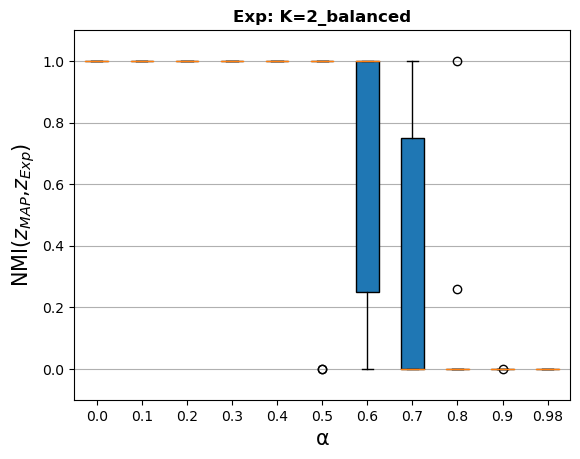

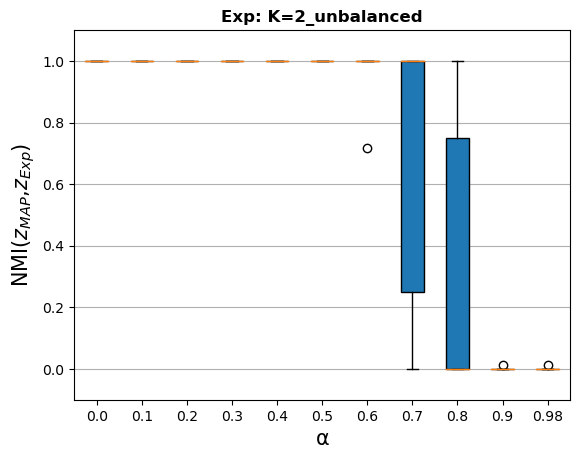

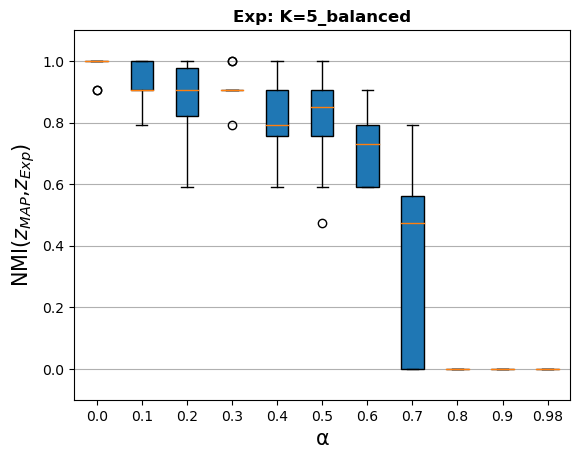

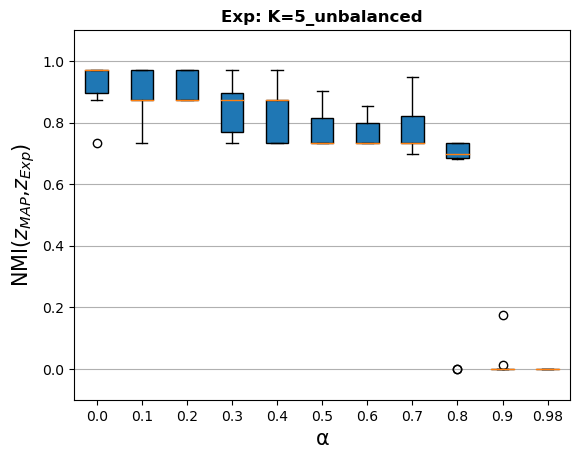

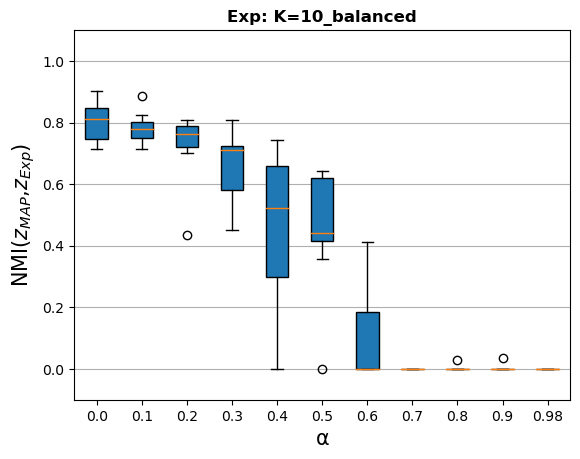

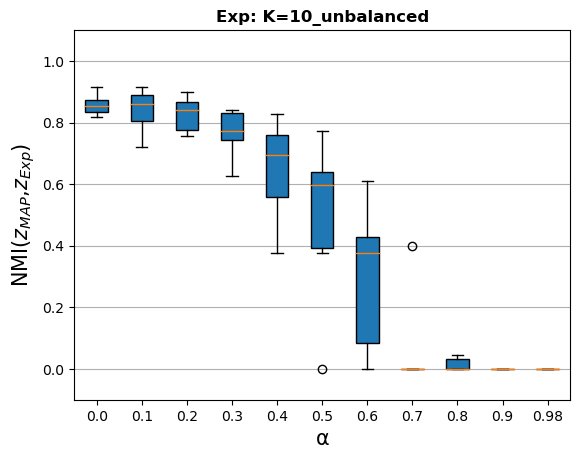

In [18]:
ini_noc = 10 # initial number of clusters
for K in [2,5,10]:
    boxplot_syn_nmi(df=df_sorted, K=K, ini_noc=ini_noc)

#### Single experiment outputs
Using results for data shown in earlier example and 10 initial clusters

In [19]:
# choose experiment
dataset = 'synthetic'

K = 2
S1 = 5
S2 = 5
Nc_type = 'unbalanced'
alpha = 0
ini_noc = 10

chosen_exp = df_sorted[(df_sorted.noc == ini_noc) & (df_sorted.K==K) & (df_sorted.S1==S1) & (df_sorted.S2==S2) & (df_sorted.Nc_type==Nc_type) & (df_sorted.alpha==alpha)]
exp_name = chosen_exp.exp_name_list.iloc[0][0]

iteration = 100

# extract results
model_sample = np.load(os.path.join(main_dir, 'results',dataset,exp_name,'model_sample'+str(iteration)+'.npy'), allow_pickle=True).item()
model_sample.keys()

MAP_sample = model_sample['MAP']

iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
#alpha = MAP_sample['alpha']
#eta0 = MAP_sample['eta0']

print('MAP logP(Z|A) =', logP)
print('MAP logP(A|Z) =', logP_A)
print('MAP logP(Z) =', logP_Z)
print('MAP noc =', noc)
#print('MAP alpha =', alpha)
#print('eta0 =', eta0)


MAP logP(Z|A) = -51901.14794902239
MAP logP(A|Z) = -51838.06239003298
MAP logP(Z) = -63.085558989405456
MAP noc = 2


##### MAP partition matrix Z

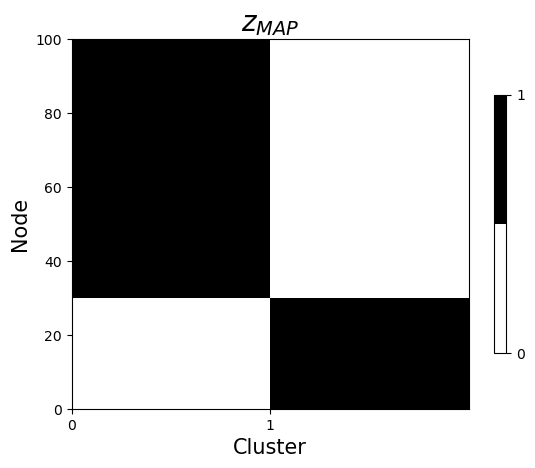

In [20]:
plot_ZMAP(Z,dataset='synthetic')

##### Cluster-link probability matrices

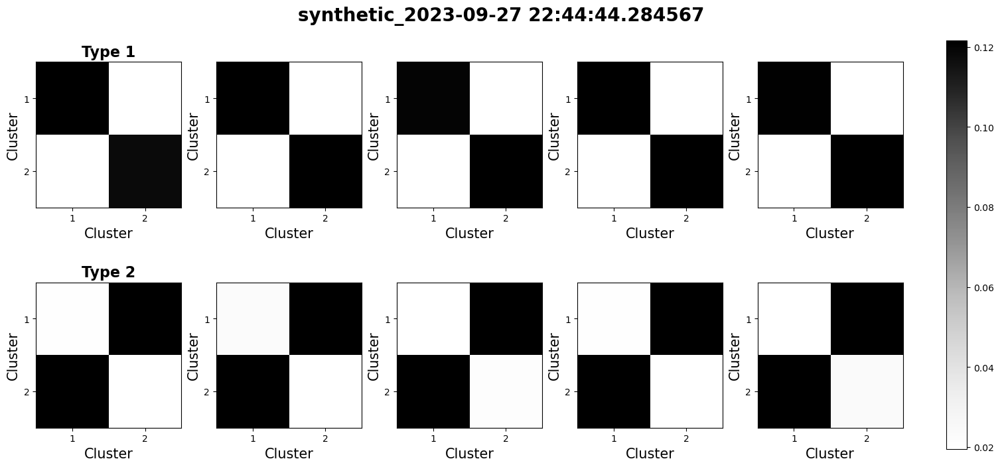

In [21]:
plot_eta(dataset=dataset, eta=eta, exp_name_title=exp_name)

## 2) HCP data


### 2.1) Data visualization
Integer-weighted graphs in Glasser atlas resolution

In [6]:
# see get_Glassergraphs.py (where numpy files with Glasser graph for each subject are computed)
A_dmri_list = []
A_fmri_list = []
for s in range(1,6):
    A_dmri = np.load(os.path.join(main_dir,'data','hcp','Glasser_A_dmri_sparse'+str(s)+'.npy'))
    A_fmri = np.load(os.path.join(main_dir,'data','hcp','Glasser_A_fmri_sparse'+str(s)+'.npy'))
    A_dmri_log = np.log(1+A_dmri)
    A_fmri_log = np.log(1+A_fmri)
    A_dmri_list.append(A_dmri_log)
    A_fmri_list.append(A_fmri_log)

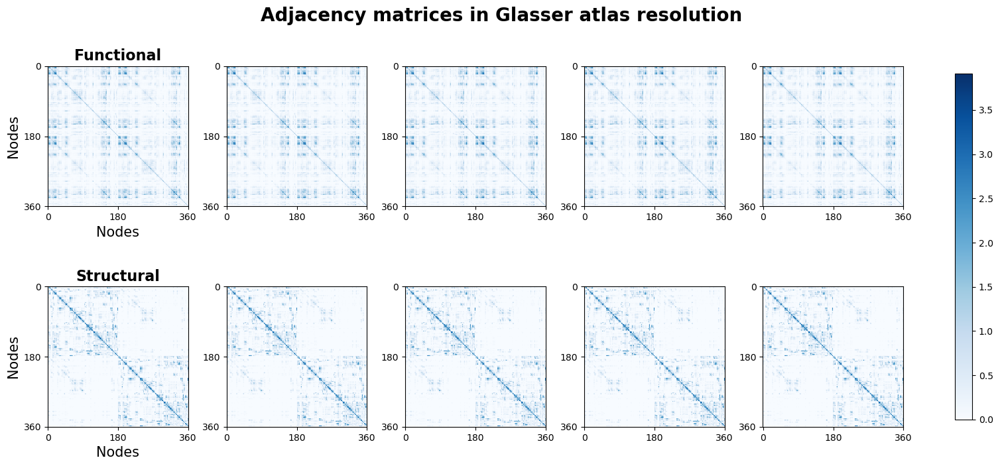

In [7]:
plot_GlasserA(A_dmri_list, A_fmri_list)

### 2.2) Experiments

In [8]:
dataset = 'hcp'
top_dir = os.path.join('results', dataset)
main_dir = os.getcwd()
df_exp = get_exp_overview(top_dir)

# sort dataframe
df_sorted = df_exp[df_exp.maxiter_gibbs == 100].sort_values(by='noc').reset_index(drop=True)

In [9]:
df_sorted

,dataset,model_type,splitmerge,noc,maxiter_gibbs,maxiter_eta0,maxiter_alpha,exp_name_list,n_exp
0,hcp,parametric,False,1,100,10,100,"[hcp_2023-10-25 09:08:55.812235, hcp_2023-09-1...",10
1,hcp,parametric,False,2,100,10,100,"[hcp_2023-09-20 04:21:55.735500, hcp_2023-10-1...",11
2,hcp,parametric,False,3,100,10,100,"[hcp_2023-10-15 07:26:59.283737, hcp_2023-09-1...",10
3,hcp,parametric,False,4,100,10,100,"[hcp_2023-10-13 06:38:59.875187, hcp_2023-10-2...",10
4,hcp,parametric,False,5,100,10,100,"[hcp_2023-10-15 19:12:10.715136, hcp_2023-10-2...",11
5,hcp,parametric,False,6,100,10,100,"[hcp_2023-10-15 23:41:35.317523, hcp_2023-10-2...",10
6,hcp,parametric,False,7,100,10,100,"[hcp_2023-10-16 07:57:48.318718, hcp_2023-09-1...",10
7,hcp,parametric,False,8,100,10,100,"[hcp_2023-09-27 14:56:35.717415, hcp_2023-10-2...",10
8,hcp,parametric,False,9,100,10,100,"[hcp_2023-10-27 13:12:29.132631, hcp_2023-10-2...",10
9,hcp,parametric,False,10,100,10,100,"[hcp_2023-09-19 09:51:31.330949, hcp_2023-10-1...",11


### 2.3) Results

#### Multiple experiments outputs

##### Log probobability over model iterations with errorbars (convergence plot)

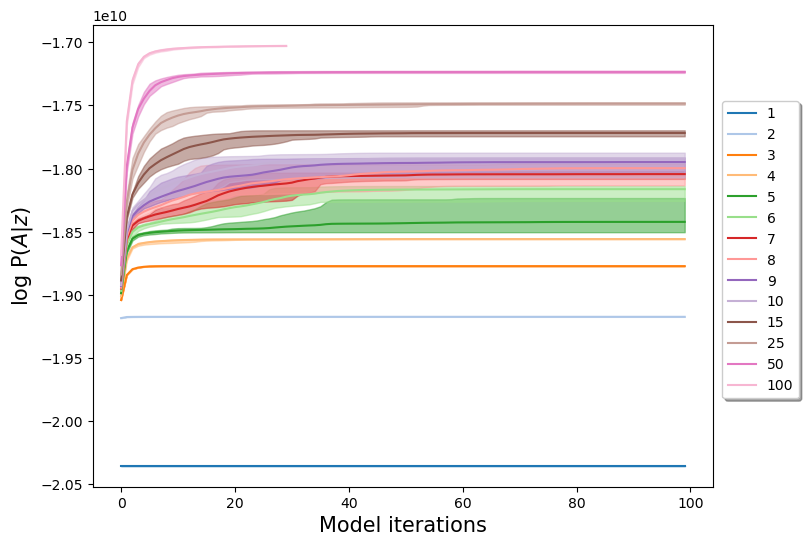

In [26]:
plot_par(dataset=dataset, df=df_sorted, par='logP_A')

##### MAP log probability over initial number of clusters with errorbars
We want to see if there exists an initial noc that maximizes the log likelihood

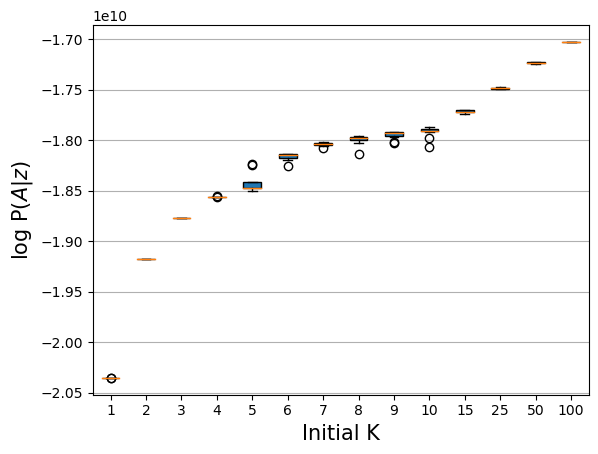

In [27]:
boxplot_par_over_ininoc(df=df_sorted, par='logP_A')

##### Mean pairwise NMI between Z's for different initializations over number of clusters 
(e.g. mean([NMI(Z1,Z2),NMI(Z1,Z3),NMI(Z2,Z3)]))


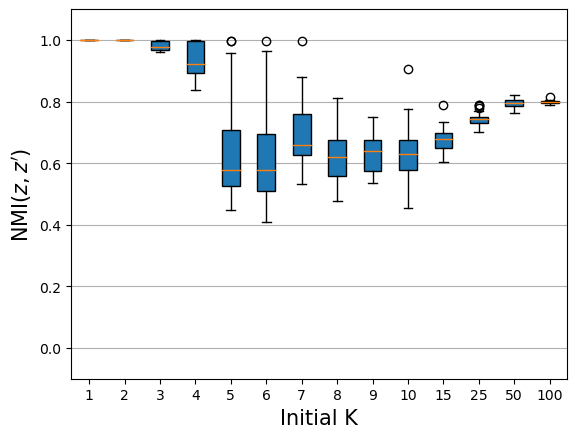

In [28]:
boxplot_par_over_ininoc(df_sorted, par='pairwise_nmi')

#### Single experiment outputs

In [10]:
# choose experiment
dataset = 'hcp'
noc = 4 # 2, 3, 4, 25, 50, 100
exp_folder = get_best_run(df=df_sorted, noc=noc) # experiment visualized is the one with highest MAP estimate across random runs

# extract results
if noc < 100:
    maxiter_gibbs = 100
else: # also including where noc=100 (they only ran 30 iterations)
    maxiter_gibbs = 30
model_sample = np.load(os.path.join(main_dir, 'results/hcp/'+exp_folder+'/model_sample'+str(maxiter_gibbs)+'.npy'), allow_pickle=True).item()
model_sample.keys()

MAP_sample = model_sample['MAP']

iter = MAP_sample['iter']
Z = MAP_sample['Z']
noc = MAP_sample['noc']
logP_A = MAP_sample['logP_A']
logP_Z = MAP_sample['logP_Z']
logP = MAP_sample['logP']
eta = MAP_sample['eta']
#alpha = MAP_sample['alpha']
#eta0 = MAP_sample['eta0']

print('MAP logP(Z|A) =', logP)
print('MAP logP(A|Z) =', logP_A)
print('MAP logP(Z) =', logP_Z)
print('MAP noc =', noc)
#print('MAP alpha =', alpha)
#print('eta0 =', eta0)


MAP logP(Z|A) = -18556516070.403637
MAP logP(A|Z) = -18556438085.545547
MAP logP(Z) = -77984.85808934446
MAP noc = 4


##### MAP partition matrix Z

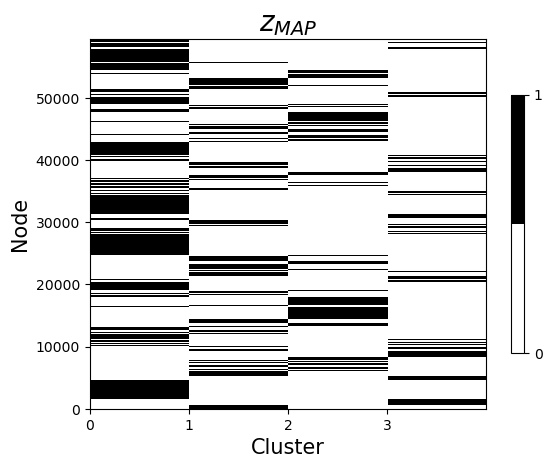

In [32]:
plot_ZMAP(Z, dataset)

##### Glasser graphs sorted/permuted wrt. Z

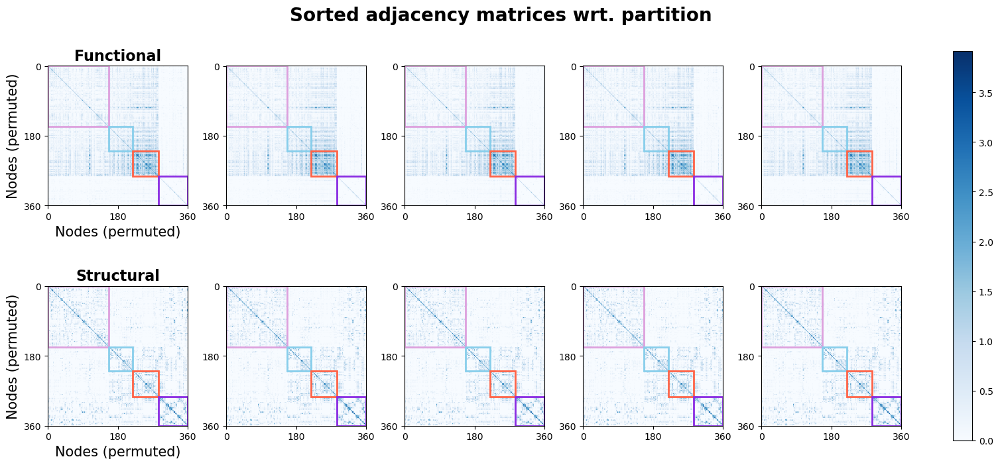

In [11]:
plot_sortedA(A_fmri_list, A_dmri_list, Z) # Adjacency matrix in Glasser atlas resolution sorted wrt. MAP partition

##### Brain map wrt. Z - from different views

In [17]:
# computing node labels using (cluster assignments) from partition
node_labels = np.argmax(Z, axis=0)+1

colors = ['gray', 'plum', 'tomato','blueviolet','skyblue', 'teal', 'olivedrab', 'maroon', 'gold', 'royalblue','yellowgreen',
          'orangered', 'chocolate', 'navajowhite', 'darkkhaki','lime','aqua', 'indigo', 'lightgreen', 'magenta', 'mediumslateblue',
          'crimson','navy', 'pink', 'saddlebrown', 'salmon']

if noc < 25:
    colors = colors[:noc+1]
if noc == 4: # modifying colors for K=4 solution to be conherent with K=3 solution (reviewer comment)
    colors = ['gray','plum', 'skyblue','tomato','blueviolet']    
elif noc == 25:
    colors = colors
else:
    #print('Error: colors for respective number of clusters are not defined')
    colors = sns.color_palette('hls', noc)
    colors.insert(0, 'gray')

cmap_all = ListedColormap(colors)

#cmap_all = ListedColormap(sns.color_palette('tab10', noc+1))
# INTERACTIVE PLOT
ni.plotting.view_surf(hcp.mesh.pial, 
                    hcp.cortex_data(node_labels), 
                    #bg_map=hcp.mesh.sulc, 
                    threshold=0.1,
                    symmetric_cmap=False,
                    cmap=cmap_all, 
                    colorbar=True)
    
    

In [18]:
# INTERACTIVE plot of a single cluster with respective label from brain map
label = 1
label_color = cmap_all.colors[label]
cmap_single = ListedColormap(sns.color_palette(['gray',label_color])) # custom palette with same color

ni.plotting.view_surf(hcp.mesh.pial, hcp.cortex_data(node_labels==label)*label, bg_map=hcp.mesh.sulc, threshold=0.1, symmetric_cmap=False, cmap=cmap_single, colorbar=False)

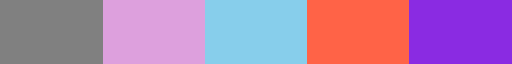

In [19]:
cmap_all

Brainmap including views: lateral_left og lateral_right, medial_left og medial_right, posterior og dorsal

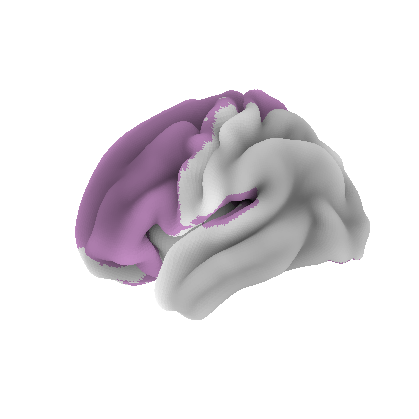

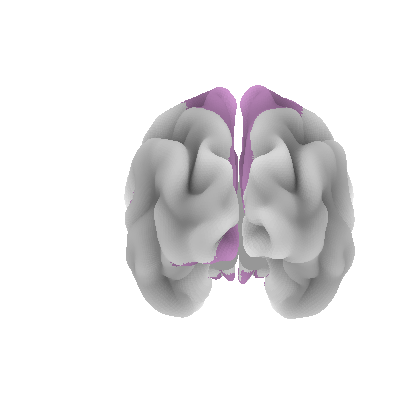

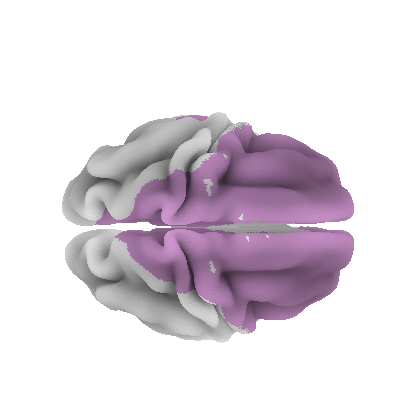

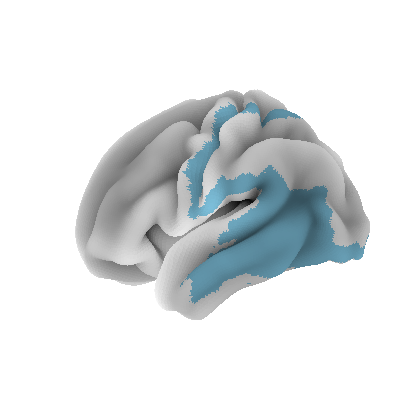

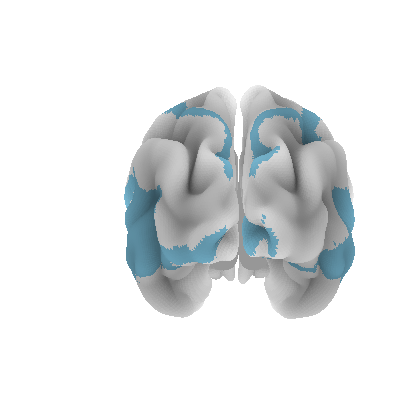

...

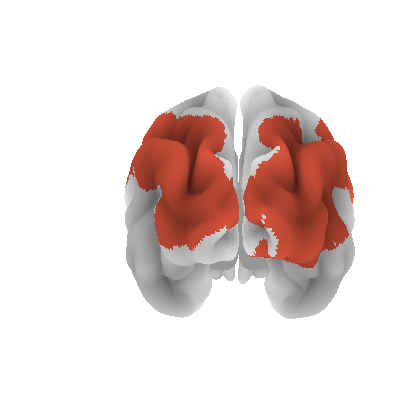

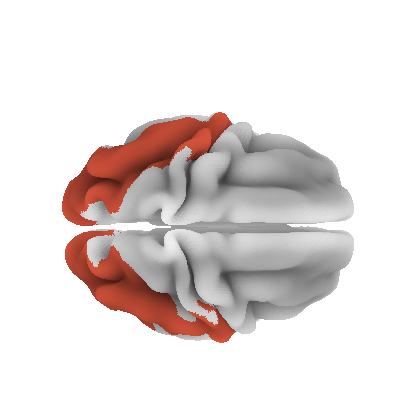

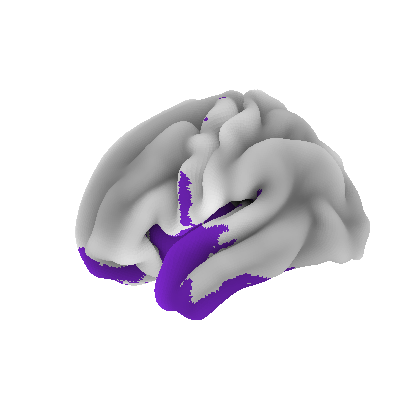

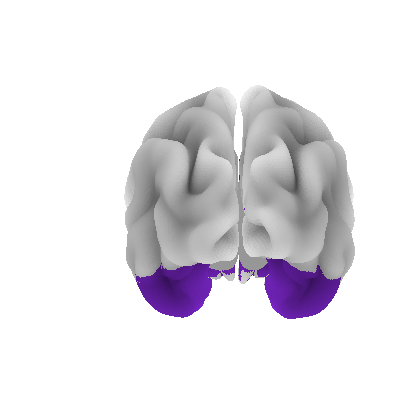

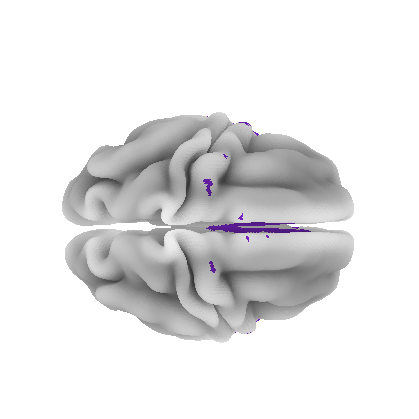

In [20]:
GENERATE_NEW_BRAINMAP = True
GENERATE_NEW_BRAINICONS = True

if GENERATE_NEW_BRAINMAP:
    # Compute brain map for different views
    parcels_L = loadmat(os.path.join(main_dir,'data','hcp','Glasser_L.mat'))['parcels'].flatten().astype(np.int32)
    parcels_R = loadmat(os.path.join(main_dir,'data','hcp','Glasser_R.mat'))['parcels'].flatten().astype(np.int32)

    view_list = ['lateral_left', 'lateral_right', 'medial_left', 'medial_right', 'posterior', 'dorsal']
    for v in view_list:
        if v == 'lateral_left':
            view = 'lateral'
            surf_mesh = hcp.mesh.pial_left
            roi_map = hcp.left_cortex_data(node_labels[:len(parcels_L)])
            bg_map = hcp.mesh.sulc_left
            hemi = 'left'
        elif v == 'lateral_right':
            view = 'lateral'
            surf_mesh = hcp.mesh.pial_right
            roi_map = hcp.right_cortex_data(node_labels[:len(parcels_R)])
            bg_map = hcp.mesh.sulc_right
            hemi = 'right'
        elif v == 'medial_left':
            view = 'medial'
            surf_mesh = hcp.mesh.pial_left
            roi_map = hcp.left_cortex_data(node_labels[:len(parcels_L)])
            bg_map = hcp.mesh.sulc_left
            hemi = 'left'
        elif v == 'medial_right':
            view = 'medial'
            surf_mesh = hcp.mesh.pial_right
            roi_map = hcp.right_cortex_data(node_labels[:len(parcels_R)])
            bg_map = hcp.mesh.sulc_right
            hemi = 'right'
        else:
            view = v
            surf_mesh = hcp.mesh.pial
            roi_map = hcp.cortex_data(node_labels)
            bg_map = hcp.mesh.sulc

        fig = ni.plotting.plot_surf_roi(surf_mesh=surf_mesh, 
                                        roi_map=roi_map,
                                        bg_map=bg_map, 
                                        hemi = hemi,
                                        bg_on_data=True,
                                        threshold=0.1, 
                                        cmap=cmap_all, 
                                        colorbar=None,
                                        view=view,
                                        output_file='figures/brainmap_'+v+'_'+str(noc)+'.png')
        #plt.savefig('figures/brainmap_'+v+'_'+str(noc)+'.png', dpi=dpi)
        
    im_list = []
    for v in view_list:
        im_list.append(Image.open('figures/brainmap_'+v+'_'+str(noc)+'.png'))
    crop_shape = (330,270)
    brainmap_merged = merge_images(im_list, crop_shape, merged_im_title='brainmap_merged_'+str(noc)+'.png')
    
if GENERATE_NEW_BRAINICONS:    
    # Create icons for eta circle graph ploto: merge different views of a single cluster and save image
    label_list = np.unique(node_labels)
    views = ['lateral', 'posterior', 'dorsal']
    crop_shape = (303,250)
    for label in label_list:
        label_color = cmap_all.colors[label]
        cmap_single = ListedColormap(sns.color_palette(['gray',label_color])) # custom palette with same color
        figs = [] # list of figures for different views of respective label
        for view in views:
            fig = ni.plotting.plot_surf_roi(hcp.mesh.pial, 
                                    hcp.cortex_data(node_labels==label)*label, 
                                    bg_map=hcp.mesh.sulc, 
                                    bg_on_data=True,
                                    threshold=0.1, 
                                    cmap=cmap_single,
                                    view=view)#,
                                    #output_file='figures/brain_'+view+'_'+str(noc)+'_'+str(label)+'.png')
            figs.append(fig)
        
        im_list = []    
        for fig in figs:
            fig.canvas.draw()
            im_list.append(Image.frombytes('RGB',fig.canvas.get_width_height(),fig.canvas.tostring_rgb()))
    
        merged_im = merge_images(im_list, crop_shape, merged_im_title='brain_merged_'+str(noc)+'_'+str(label)+'.png')        

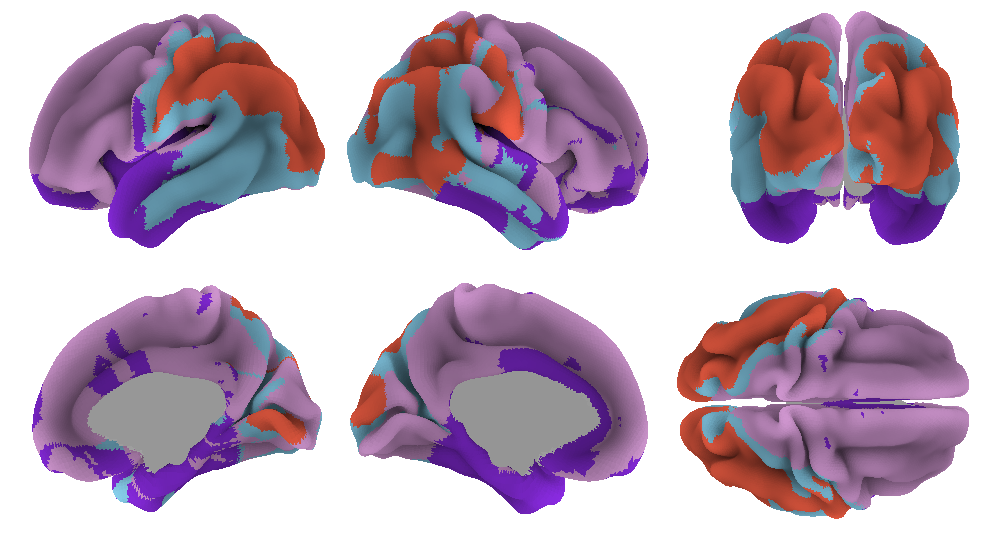

In [21]:
brainmap_merged

##### Learned cluster-link probability matrices $\eta$

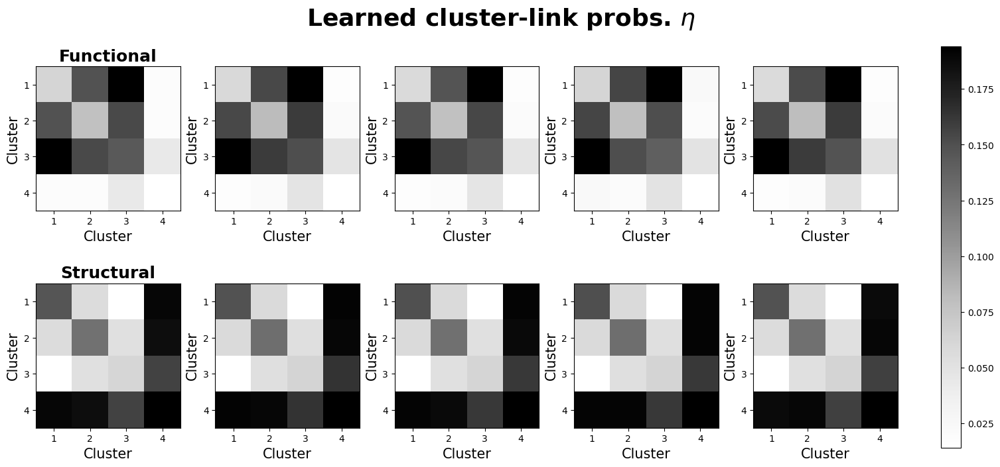

In [22]:
plot_eta(dataset=dataset, eta=eta, exp_name_title='Learned cluster-link probs. $\eta$', title_fontsize=26, subtitle_fontsize=18)

##### Cluster-link density matrices $\eta_D$

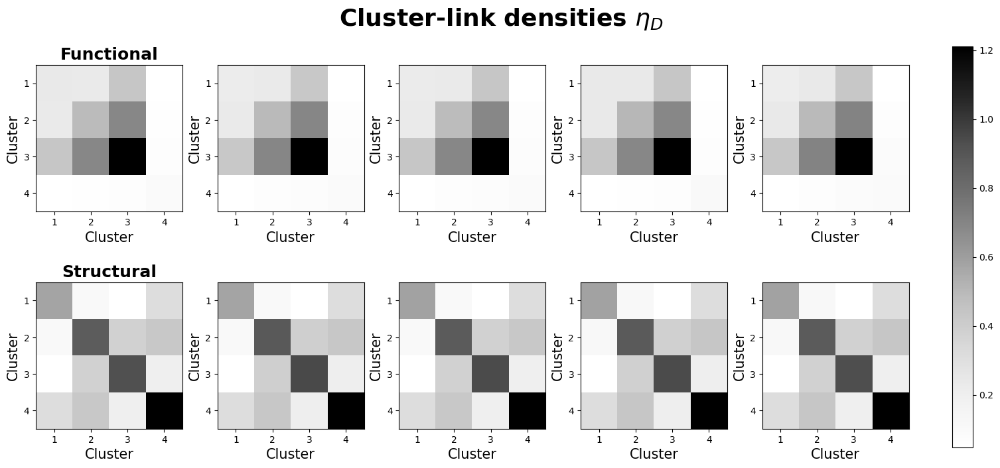

In [23]:
data_path = os.path.join(main_dir, 'data','hcp')
etaD = np.load(os.path.join(data_path,'etaD_'+str(noc)+'.npy'))
etaD_log = np.log(1+etaD)
plot_eta(dataset, eta=etaD_log, exp_name_title='Cluster-link densities $\eta_D$', title_fontsize=26, subtitle_fontsize=18)
# "Cluster-link densities" or "Adjacency matrix in MAP partition resolution"

##### Circular graph plot: Mean cluster-link probability with-in groups (across either dmri or fmri graphs)

Entropy (used for link-width):
https://en.wikipedia.org/wiki/Dirichlet_distribution

$\overline{\mathbf{\nu}}_{l,m}+\overline{\mathbf{\eta}}_{0}\sim \text{Dir}(\overline{\mathbf{\nu}}_{l,m}+\overline{\mathbf{\eta}}_{0})$

\begin{align}
H(\overline{\mathbf{\nu}}_{l,m}+\overline{\mathbf{\eta}}_{0}) &=
\log B(\overline{\mathbf{\nu}}_{l,m}+\overline{\mathbf{\eta}}_{0}) + \left(\left(\sum_{s=1}^S\nu_{l,m,s}+\eta_{0,s}\right)-S\right)\psi\left(\sum_{s=1}^S\nu_{l,m,s}+\eta_{0,s}\right) - \sum_{s=1}^S(\nu_{l,m,s}+\eta_{0,s}-1)\psi\left(\nu_{l,m,s}+\eta_{0,s}\right
)
\end{align}

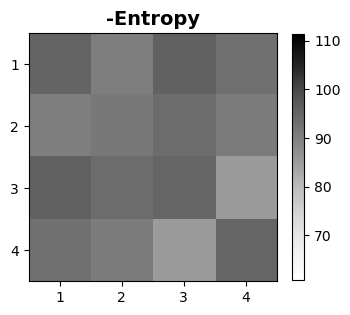

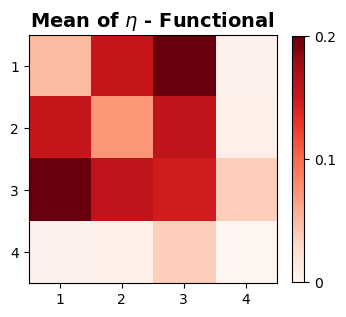

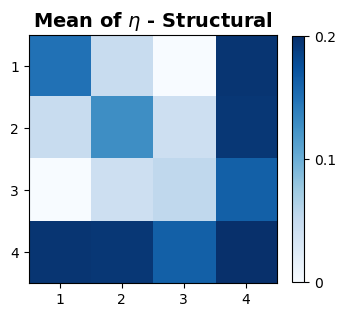

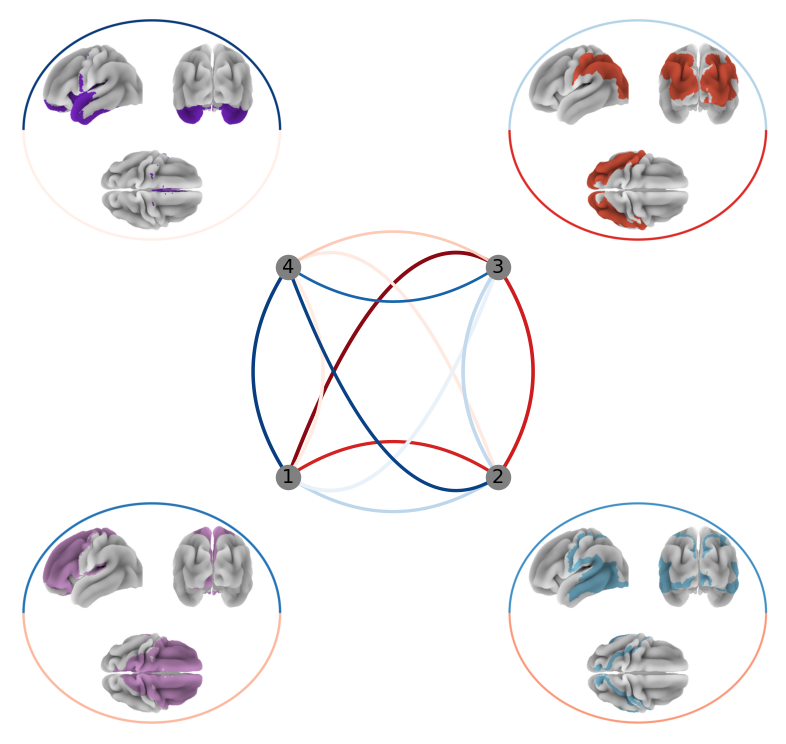

In [25]:
percentile = 80 # showing top 20% links
if noc == 25:
    eta_mean_f = np.mean(eta[:,:,:5],axis=2) # mean eta over functional graphs
    eta_mean_s = np.mean(eta[:,:,5:],axis=2) # mean eta over structural graphs
    thres = np.percentile([eta_mean_f,eta_mean_s],percentile)
else: 
    thres = 0
eta0 = MAP_sample['eta0']
plot_eta_graph(eta=eta, eta0=eta0, diff_metric='diff_entropy', lw_lower=0, lw_upper=4, thres=thres, plot_function=True, plot_structure=True)